# Import Libraries

In [1]:
!pip install keras==2.3.1

     |████████████████████████████████| 377 kB 605 kB/s 
     |████████████████████████████████| 50 kB 3.1 MB/s 


In [2]:
import zipfile
import os
import cv2
import seaborn as sns
import numpy as np
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
import tensorflow as tf
import pandas as pd
import matplotlib.pyplot as plt

2021-10-01 16:12:20.122980: W tensorflow/stream_executor/platform/default/dso_loader.cc:60] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /opt/conda/lib
2021-10-01 16:12:20.123105: I tensorflow/stream_executor/cuda/cudart_stub.cc:29] Ignore above cudart dlerror if you do not have a GPU set up on your machine.


# Importing Dataset

In [3]:
directory = '../input/homerbart1/homer_bart_1'  #path of extracted dataset (current location)
files = [os.path.join(directory, f) for f in sorted(os.listdir(directory))] #contains paths of each images

export = 'mouth,pants,shoes,tshirt,shorts,sneakers,class\n' #feature names (to make as heading in csv file later)

show_images = True #whether to show the images or not
features = [] #contains all features

# Feature Extraction

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.114799225
Bart TShirt: 6.886101887 - Bart Shorts: 3.495204355 - Bart Sneakers: 3.495204355


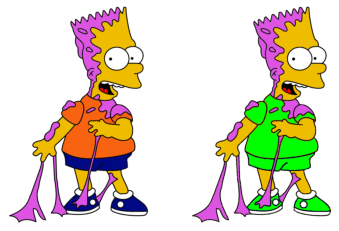

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.11007847
Bart TShirt: 5.004901113 - Bart Shorts: 3.183888705 - Bart Sneakers: 3.183888705


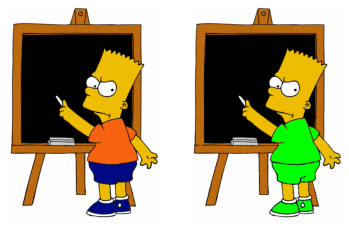

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.182518631
Bart TShirt: 5.264620437 - Bart Shorts: 5.029682961 - Bart Sneakers: 5.029682961


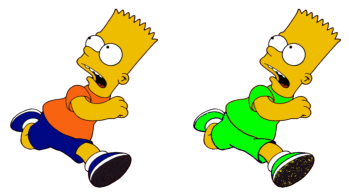

Homer Mouth: 0.0 - Homer Pants: 0.480168257 - Homer Shoes: 0.080028043
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


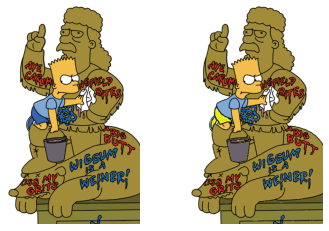

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.029707562
Bart TShirt: 8.978929368 - Bart Shorts: 3.459119497 - Bart Sneakers: 3.459119497


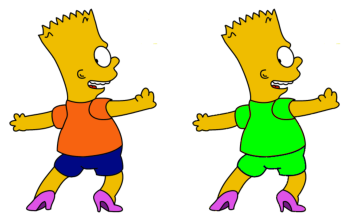

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.053304904
Bart TShirt: 6.75432362 - Bart Shorts: 0.948827292 - Bart Sneakers: 0.948827292


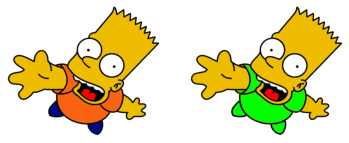

Homer Mouth: 0.249585206 - Homer Pants: 0.0 - Homer Shoes: 0.019853369
Bart TShirt: 9.693407263 - Bart Shorts: 4.104683977 - Bart Sneakers: 4.104683977


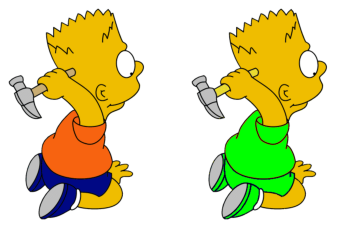

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.181208054
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


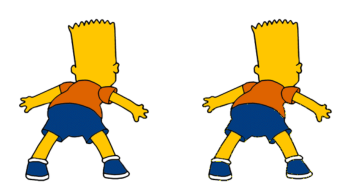

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.148868778
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


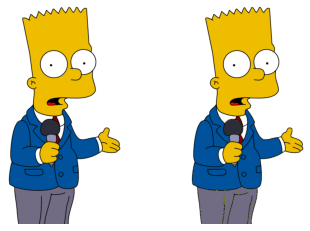

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.114762211
Bart TShirt: 9.594752524 - Bart Shorts: 7.522715548 - Bart Sneakers: 7.522715548


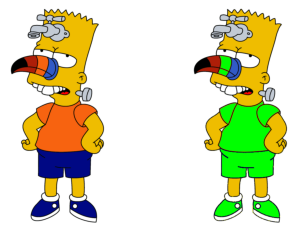

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.138655462
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


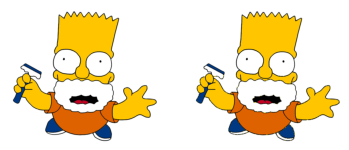

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.02400947
Bart TShirt: 19.545383481 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


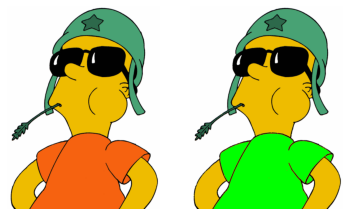

Homer Mouth: 0.00307645 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 6.495154592 - Bart Shorts: 5.599138594 - Bart Sneakers: 5.599138594


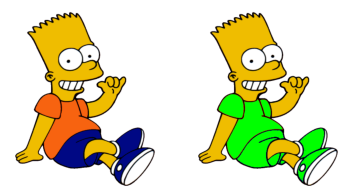

Homer Mouth: 0.001317263 - Homer Pants: 0.0 - Homer Shoes: 0.087817515
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


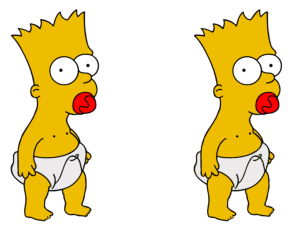

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.032184591
Bart TShirt: 8.395721925 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


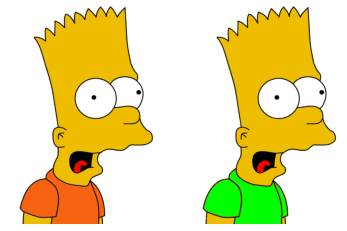

Homer Mouth: 0.02105732 - Homer Pants: 0.0 - Homer Shoes: 0.008503918
Bart TShirt: 8.915750471 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


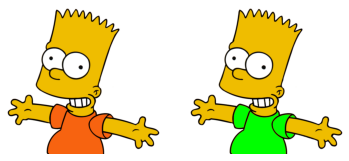

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.081055114
Bart TShirt: 11.095816228 - Bart Shorts: 4.525111363 - Bart Sneakers: 4.525111363


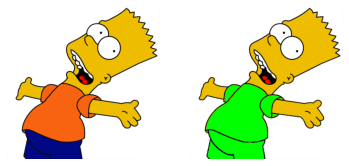

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.08757526
Bart TShirt: 10.443349754 - Bart Shorts: 3.183296307 - Bart Sneakers: 3.183296307


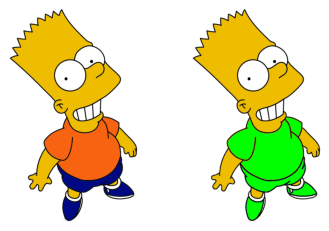

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.043806812
Bart TShirt: 9.497408097 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


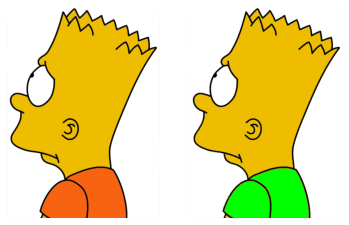

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.141247989
Bart TShirt: 4.750581083 - Bart Shorts: 3.600482746 - Bart Sneakers: 3.600482746


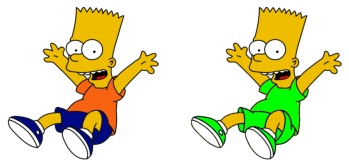

Homer Mouth: 0.0 - Homer Pants: 0.010463297 - Homer Shoes: 0.391691233
Bart TShirt: 7.430305346 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


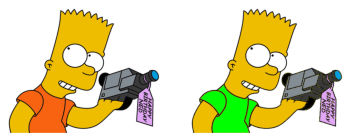

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.145441759
Bart TShirt: 12.530766526 - Bart Shorts: 2.373417722 - Bart Sneakers: 2.373417722


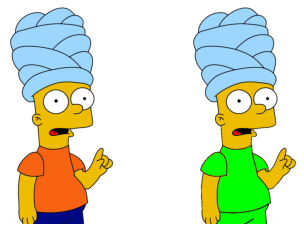

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.298828743
Bart TShirt: 11.88730611 - Bart Shorts: 6.866729978 - Bart Sneakers: 6.866729978


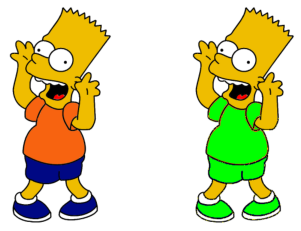

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.110318564
Bart TShirt: 2.206749078 - Bart Shorts: 3.37340567 - Bart Sneakers: 0.0


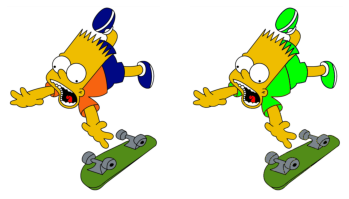

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.083622139
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


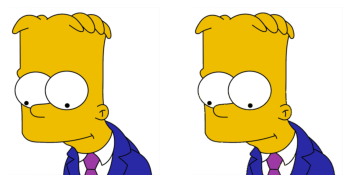

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.069784112
Bart TShirt: 9.781371226 - Bart Shorts: 6.301652893 - Bart Sneakers: 6.301652893


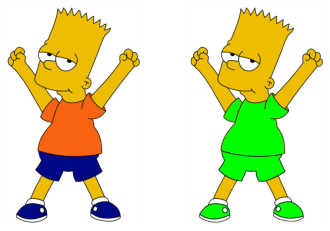

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.088388486
Bart TShirt: 4.322113293 - Bart Shorts: 5.937642899 - Bart Sneakers: 5.937642899


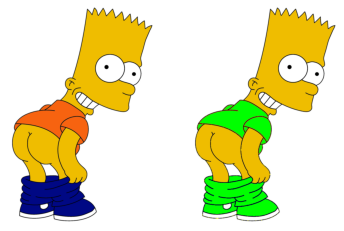

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.144211187
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


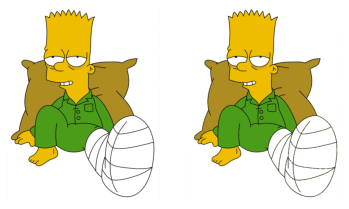

Homer Mouth: 0.07 - Homer Pants: 0.0 - Homer Shoes: 0.344285714
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


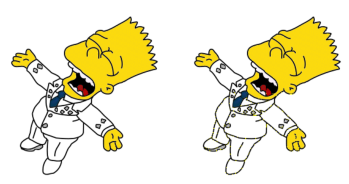

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.07980941
Bart TShirt: 11.305241215 - Bart Shorts: 7.723942823 - Bart Sneakers: 7.723942823


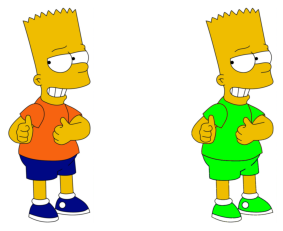

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.379403794
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


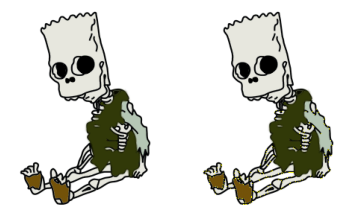

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.090175198
Bart TShirt: 11.35992786 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


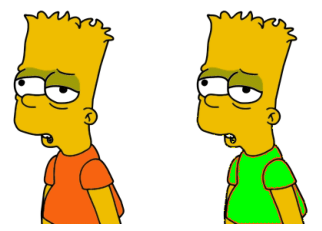

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.084393721
Bart TShirt: 5.738773012 - Bart Shorts: 3.398924308 - Bart Sneakers: 3.398924308


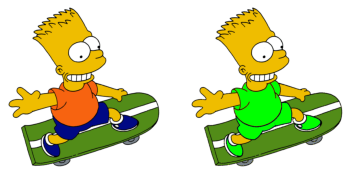

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.162677013
Bart TShirt: 5.02834647 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


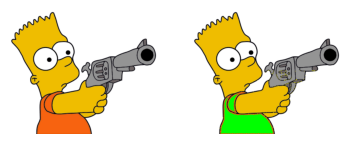

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.050130084
Bart TShirt: 0.0 - Bart Shorts: 2.312329463 - Bart Sneakers: 1.435370265


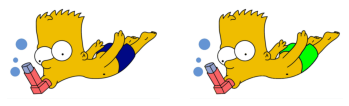

Homer Mouth: 0.000832432 - Homer Pants: 0.0 - Homer Shoes: 0.198951136
Bart TShirt: 16.896695247 - Bart Shorts: 1.144593357 - Bart Sneakers: 1.144593357


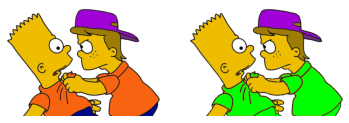

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.108054523
Bart TShirt: 13.608921933 - Bart Shorts: 0.269640644 - Bart Sneakers: 0.269640644


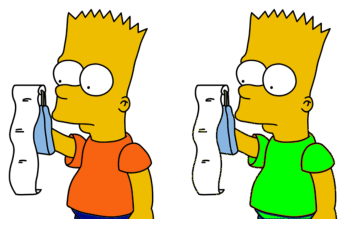

Homer Mouth: 0.057218819 - Homer Pants: 0.0 - Homer Shoes: 0.082649405
Bart TShirt: 7.449427812 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


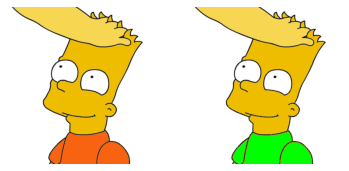

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.065466448
Bart TShirt: 7.435477779 - Bart Shorts: 1.739896764 - Bart Sneakers: 1.739896764


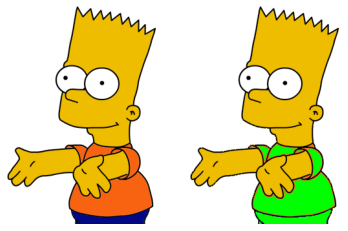

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.076230076
Bart TShirt: 3.805959806 - Bart Shorts: 2.272349272 - Bart Sneakers: 2.272349272


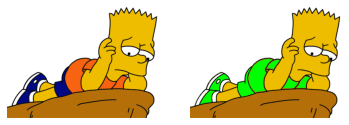

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.05304784
Bart TShirt: 4.813762626 - Bart Shorts: 5.155285494 - Bart Sneakers: 5.155285494


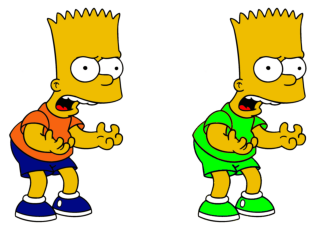

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.057656907
Bart TShirt: 10.597756243 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


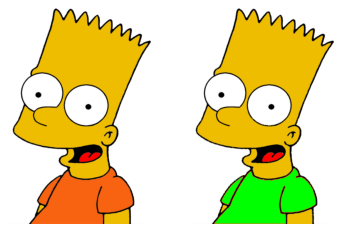

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 4.180478037
Bart TShirt: 7.972817519 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


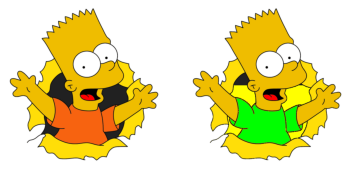

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.166613773
Bart TShirt: 5.126150428 - Bart Shorts: 7.112821327 - Bart Sneakers: 7.112821327


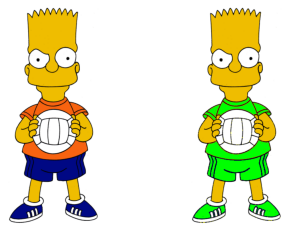

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.108311229
Bart TShirt: 0.0 - Bart Shorts: 18.927203065 - Bart Sneakers: 17.73135868


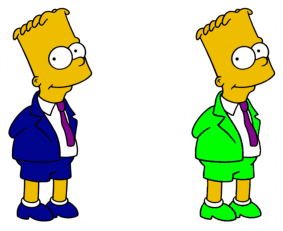

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.13699873
Bart TShirt: 3.036351539 - Bart Shorts: 1.797919313 - Bart Sneakers: 1.797919313


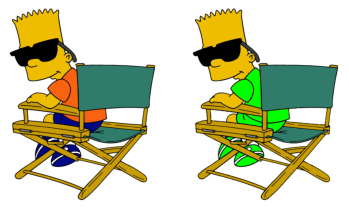

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.086580087
Bart TShirt: 8.149012446 - Bart Shorts: 2.357954545 - Bart Sneakers: 2.357954545


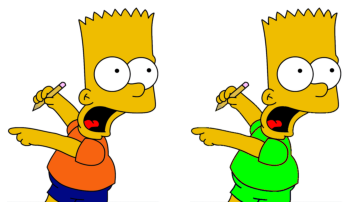

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.151135698
Bart TShirt: 13.635152613 - Bart Shorts: 5.732015094 - Bart Sneakers: 5.732015094


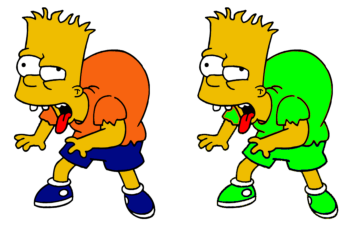

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.183020488
Bart TShirt: 9.865659541 - Bart Shorts: 3.991215017 - Bart Sneakers: 3.991215017


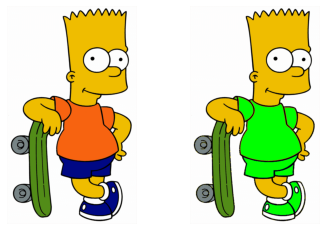

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.126150813
Bart TShirt: 2.49238361 - Bart Shorts: 6.490779573 - Bart Sneakers: 6.03685943


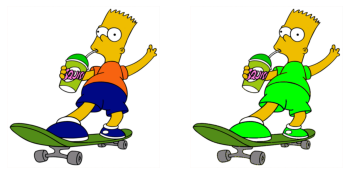

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.152807573
Bart TShirt: 4.91155038 - Bart Shorts: 2.840773658 - Bart Sneakers: 2.840773658


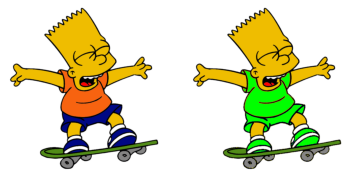

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 1.187012385 - Bart Shorts: 1.807232793 - Bart Sneakers: 1.807232793


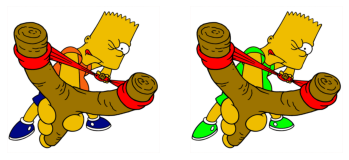

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.02433848
Bart TShirt: 8.855312603 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


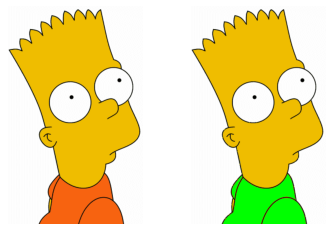

Homer Mouth: 2.452787678 - Homer Pants: 0.0 - Homer Shoes: 0.068104543
Bart TShirt: 4.658248331 - Bart Shorts: 3.879910696 - Bart Sneakers: 3.879910696


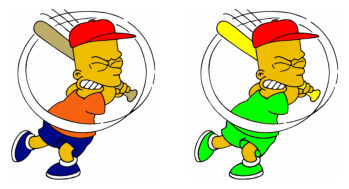

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


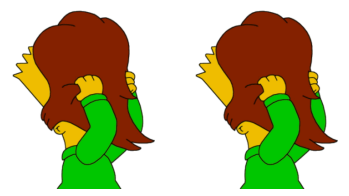

Homer Mouth: 0.002290583 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 6.528926251 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


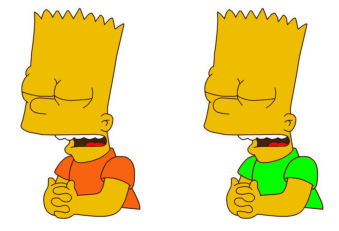

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.056179775
Bart TShirt: 12.13282504 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


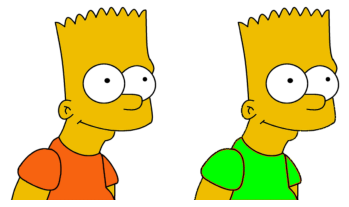

Homer Mouth: 0.000888889 - Homer Pants: 0.0 - Homer Shoes: 0.094222222
Bart TShirt: 5.550222222 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


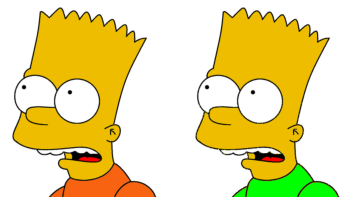

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 2.704001299 - Bart Shorts: 2.038146254 - Bart Sneakers: 0.849606363


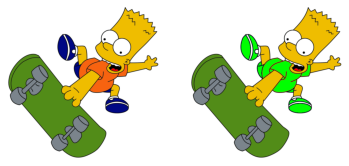

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.078947368
Bart TShirt: 0.484892788 - Bart Shorts: 1.314814815 - Bart Sneakers: 1.314814815


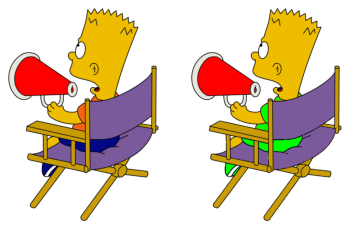

Homer Mouth: 0.129449838 - Homer Pants: 0.0 - Homer Shoes: 0.220989367
Bart TShirt: 3.006010171 - Bart Shorts: 1.178455848 - Bart Sneakers: 1.178455848


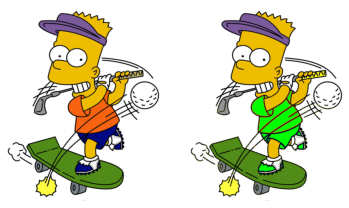

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 2.278061846 - Bart Shorts: 3.270189108 - Bart Sneakers: 3.270189108


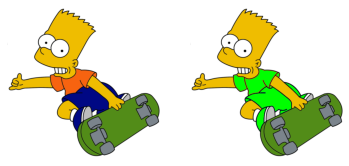

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.048163557
Bart TShirt: 3.585693763 - Bart Shorts: 4.931366932 - Bart Sneakers: 4.931366932


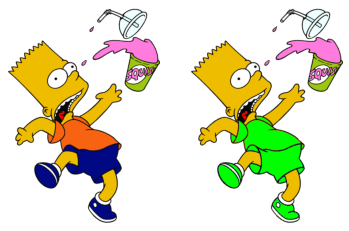

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.580333855
Bart TShirt: 0.721749478 - Bart Shorts: 0.737235915 - Bart Sneakers: 0.0


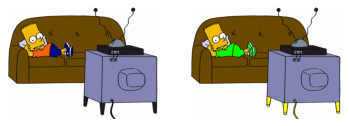

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.156095181
Bart TShirt: 4.259996037 - Bart Shorts: 4.505419125 - Bart Sneakers: 4.505419125


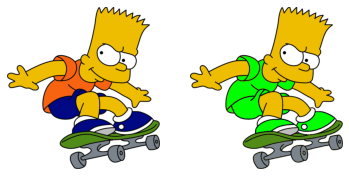

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.113855066
Bart TShirt: 9.469978468 - Bart Shorts: 5.73372206 - Bart Sneakers: 5.73372206


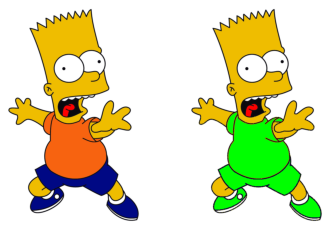

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.112589904
Bart TShirt: 5.532449419 - Bart Shorts: 7.887174834 - Bart Sneakers: 7.887174834


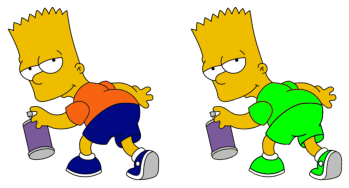

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.101010101
Bart TShirt: 10.84387737 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


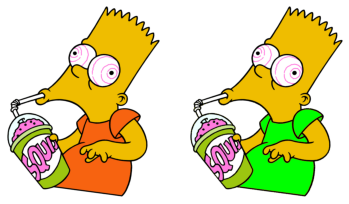

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.130730051
Bart TShirt: 2.291680815 - Bart Shorts: 2.954499151 - Bart Sneakers: 2.095755518


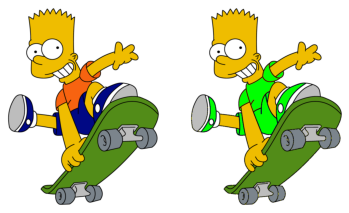

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.084417626
Bart TShirt: 6.410571154 - Bart Shorts: 4.413835877 - Bart Sneakers: 4.413835877


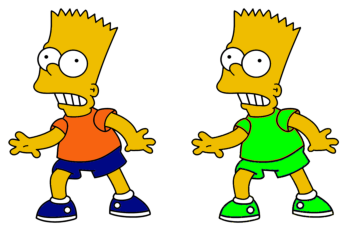

Homer Mouth: 0.072235674 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 3.773204197 - Bart Shorts: 1.920500404 - Bart Sneakers: 1.920500404


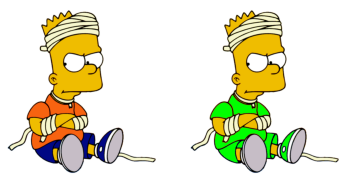

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.095862315
Bart TShirt: 6.44172463 - Bart Shorts: 5.603486713 - Bart Sneakers: 5.603486713


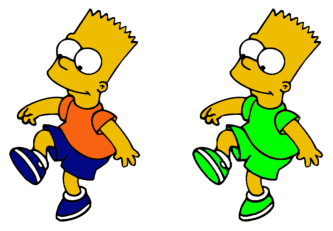

Homer Mouth: 0.0 - Homer Pants: 0.079648273 - Homer Shoes: 0.713011342
Bart TShirt: 3.013253473 - Bart Shorts: 1.752262011 - Bart Sneakers: 1.752262011


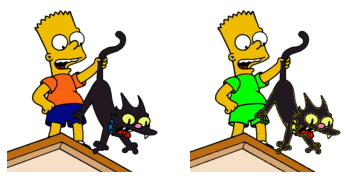

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.077600637
Bart TShirt: 17.164367088 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


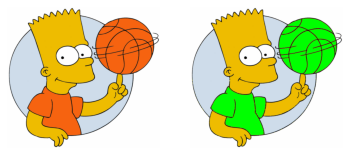

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.138044446
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


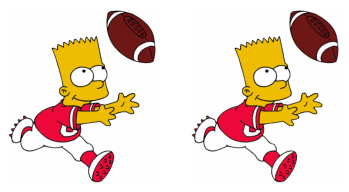

Homer Mouth: 0.256359764 - Homer Pants: 0.0 - Homer Shoes: 1.935279188
Bart TShirt: 2.087344653 - Bart Shorts: 0.331116168 - Bart Sneakers: 0.0189626


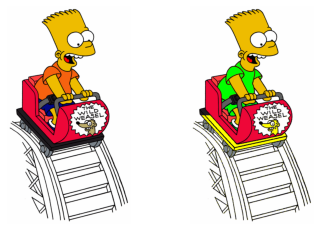

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.306571323
Bart TShirt: 3.656376567 - Bart Shorts: 4.276107978 - Bart Sneakers: 4.276107978


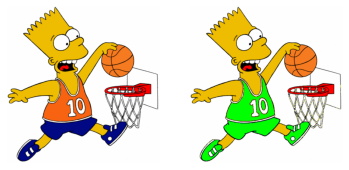

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.182729644
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


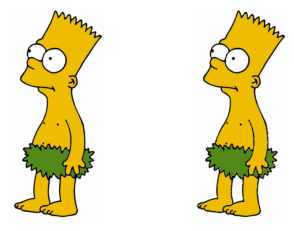

Homer Mouth: 0.0 - Homer Pants: 0.035811365 - Homer Shoes: 0.081114898
Bart TShirt: 8.256461147 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


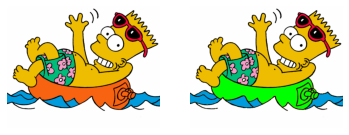

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.063650201
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


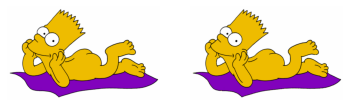

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.15935811
Bart TShirt: 8.37577311 - Bart Shorts: 7.56728144 - Bart Sneakers: 7.56728144


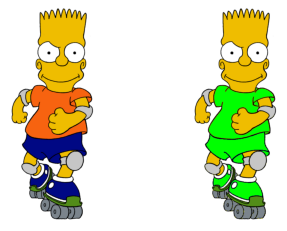

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.127103473
Bart TShirt: 6.08575009 - Bart Shorts: 0.998925886 - Bart Sneakers: 0.957303974


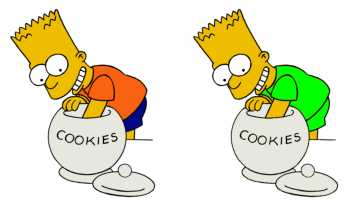

Homer Mouth: 0.0 - Homer Pants: 0.21020082 - Homer Shoes: 0.12724967
Bart TShirt: 2.054235286 - Bart Shorts: 1.480091724 - Bart Sneakers: 1.480091724


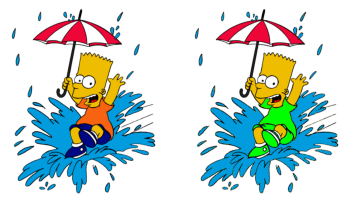

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.067023482
Bart TShirt: 6.311297555 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


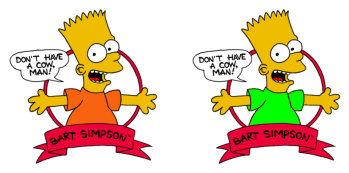

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.089739311
Bart TShirt: 8.347980866 - Bart Shorts: 8.240442022 - Bart Sneakers: 8.240442022


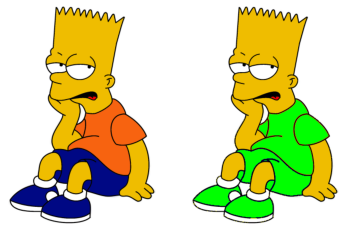

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.06409324
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


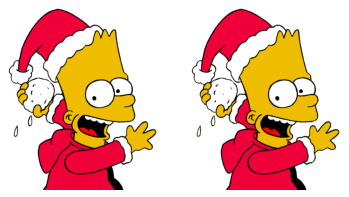

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.059352518
Bart TShirt: 9.928507194 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


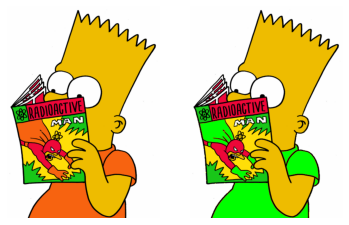

Homer Mouth: 0.620192308 - Homer Pants: 0.0 - Homer Shoes: 0.151442308
Bart TShirt: 5.380608974 - Bart Shorts: 4.139423077 - Bart Sneakers: 4.139423077


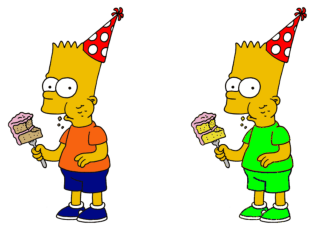

Homer Mouth: 0.0 - Homer Pants: 0.020169769 - Homer Shoes: 0.169082748
Bart TShirt: 0.0 - Bart Shorts: 2.887281029 - Bart Sneakers: 2.887281029


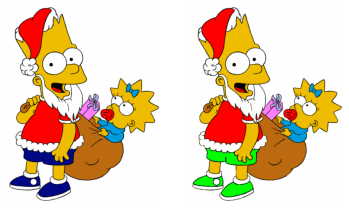

Homer Mouth: 0.0 - Homer Pants: 0.022174372 - Homer Shoes: 0.075276158
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


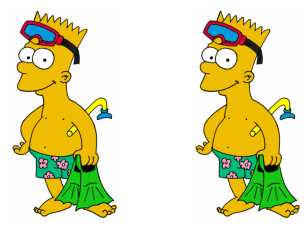

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.088223514
Bart TShirt: 5.356195672 - Bart Shorts: 4.325658429 - Bart Sneakers: 4.325658429


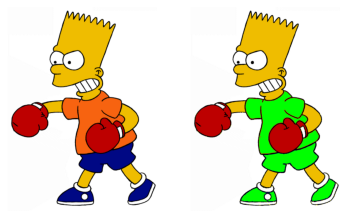

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.036128255
Bart TShirt: 0.0 - Bart Shorts: 14.04862261 - Bart Sneakers: 7.565858799


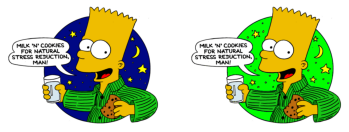

Homer Mouth: 4.469270958 - Homer Pants: 0.0 - Homer Shoes: 0.048356864
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


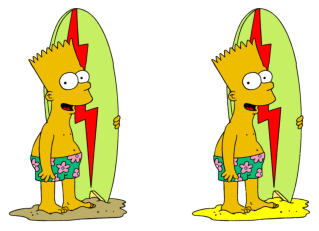

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.515769828
Bart TShirt: 3.451480154 - Bart Shorts: 3.807950898 - Bart Sneakers: 3.313264772


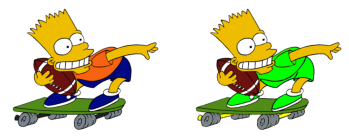

Homer Mouth: 0.003738178 - Homer Pants: 0.0 - Homer Shoes: 0.20746888
Bart TShirt: 0.0 - Bart Shorts: 3.104556839 - Bart Sneakers: 3.104556839


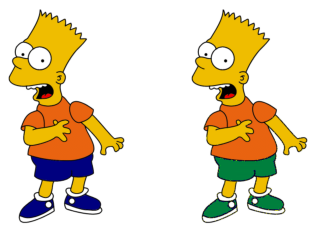

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.119900917
Bart TShirt: 1.333403605 - Bart Shorts: 1.42563508 - Bart Sneakers: 1.42563508


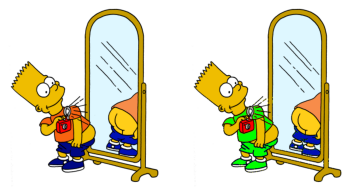

Homer Mouth: 0.016800478 - Homer Pants: 0.0 - Homer Shoes: 0.029723923
Bart TShirt: 3.016978176 - Bart Shorts: 2.22412484 - Bart Sneakers: 2.22412484


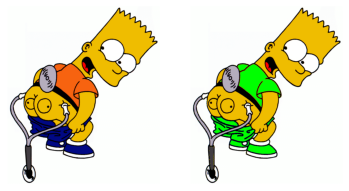

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.038138825
Bart TShirt: 9.655055513 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


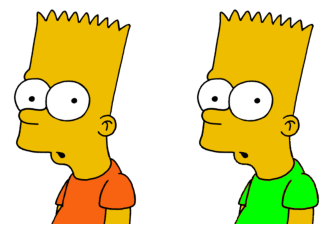

Homer Mouth: 0.002855457 - Homer Pants: 0.004283185 - Homer Shoes: 0.047115037
Bart TShirt: 10.154480212 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


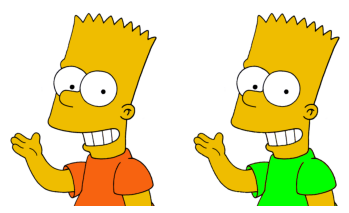

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 4.442616207 - Bart Shorts: 1.551764881 - Bart Sneakers: 1.551764881


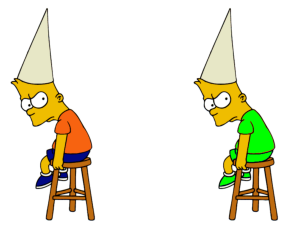

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 8.667226891 - Bart Shorts: 3.921848739 - Bart Sneakers: 3.921848739


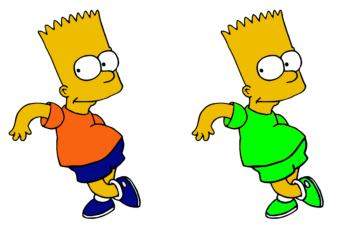

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 8.113564866 - Bart Shorts: 5.822234048 - Bart Sneakers: 5.822234048


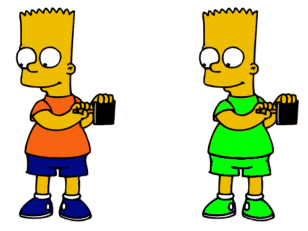

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.11212159
Bart TShirt: 6.242393461 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


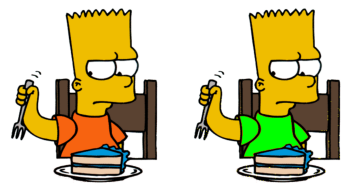

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.594795539
Bart TShirt: 0.0 - Bart Shorts: 14.857215275 - Bart Sneakers: 6.850287259


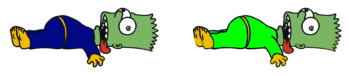

Homer Mouth: 0.001554726 - Homer Pants: 0.047419154 - Homer Shoes: 0.359919154
Bart TShirt: 0.0 - Bart Shorts: 1.773165423 - Bart Sneakers: 1.773165423


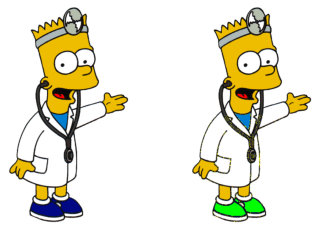

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.12787018
Bart TShirt: 0.000919929 - Bart Shorts: 0.025758022 - Bart Sneakers: 0.022998234


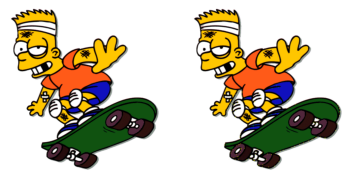

Homer Mouth: 4.469270958 - Homer Pants: 0.0 - Homer Shoes: 0.048356864
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


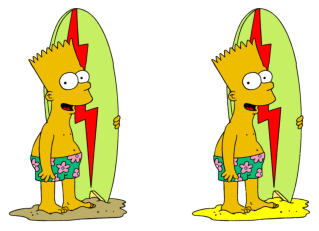

Homer Mouth: 0.0 - Homer Pants: 0.031103271 - Homer Shoes: 0.095440175
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


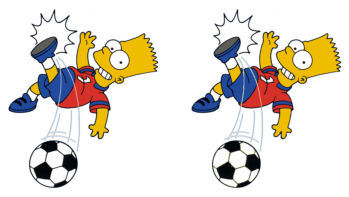

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.096296296
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


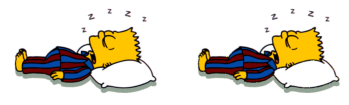

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.030959752
Bart TShirt: 2.493227554 - Bart Shorts: 0.86880805 - Bart Sneakers: 0.86880805


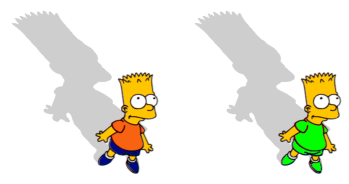

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.315630575
Bart TShirt: 0.0 - Bart Shorts: 0.091487123 - Bart Sneakers: 0.091487123


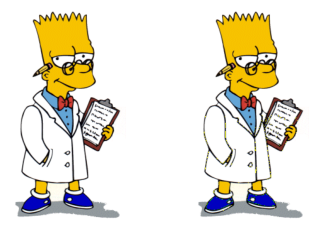

Homer Mouth: 0.082892416 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 8.386243386 - Bart Shorts: 5.733686067 - Bart Sneakers: 5.733686067


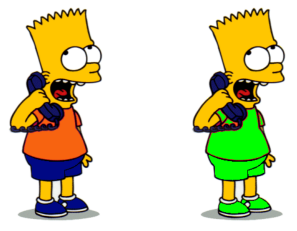

Homer Mouth: 0.028748341 - Homer Pants: 0.0 - Homer Shoes: 0.314020345
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


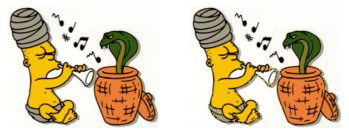

Homer Mouth: 0.004464286 - Homer Pants: 0.080357143 - Homer Shoes: 0.046875
Bart TShirt: 0.064732143 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


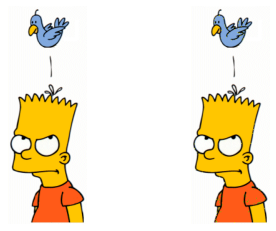

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.162836426
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


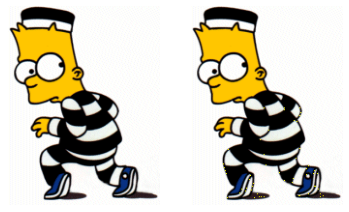

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.047342881
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


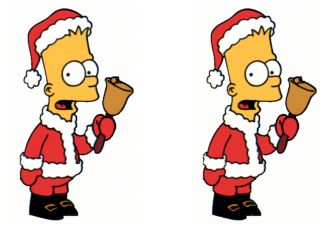

Homer Mouth: 0.002855457 - Homer Pants: 0.004283185 - Homer Shoes: 0.047115037
Bart TShirt: 10.154480212 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


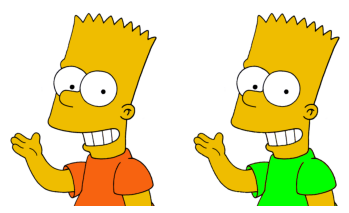

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 11.901625849 - Bart Shorts: 0.436989778 - Bart Sneakers: 0.436989778


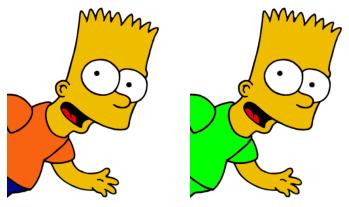

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.06820873
Bart TShirt: 0.0 - Bart Shorts: 7.009674726 - Bart Sneakers: 7.009674726


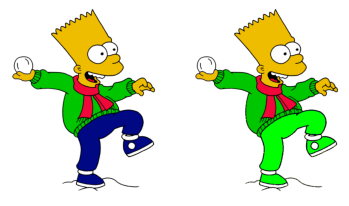

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 2.423072216 - Bart Shorts: 3.600614606 - Bart Sneakers: 1.095957467


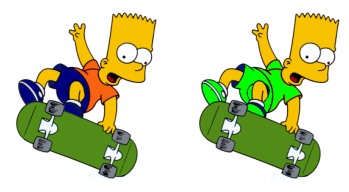

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.048370171
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


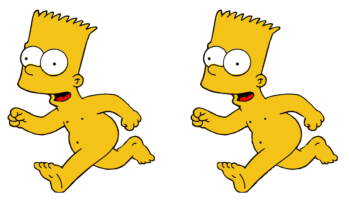

Homer Mouth: 0.046402056 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


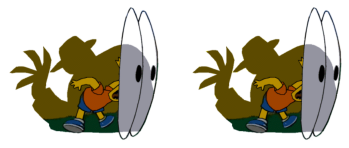

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.125109894
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


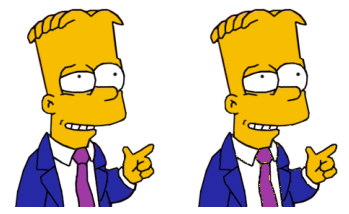

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.495459566
Bart TShirt: 12.964780955 - Bart Shorts: 0.997054853 - Bart Sneakers: 0.026076819


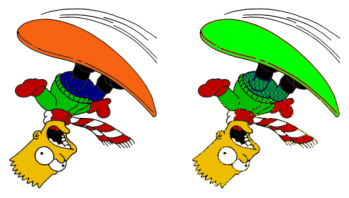

Homer Mouth: 0.024496995 - Homer Pants: 0.0 - Homer Shoes: 0.169029266
Bart TShirt: 3.695779984 - Bart Shorts: 0.013065064 - Bart Sneakers: 0.004082833


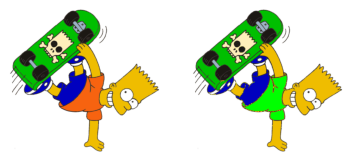

Homer Mouth: 0.126262626 - Homer Pants: 0.0 - Homer Shoes: 0.089031339
Bart TShirt: 0.178062678 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


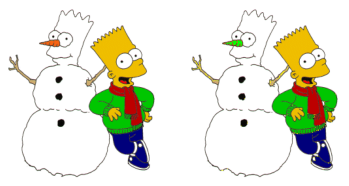

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.342702852
Bart TShirt: 4.158589495 - Bart Shorts: 1.07887935 - Bart Sneakers: 1.07887935


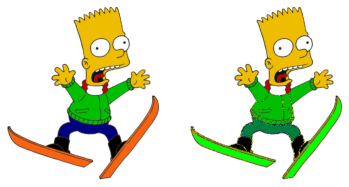

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.009876543
Bart TShirt: 0.540740741 - Bart Shorts: 3.417283951 - Bart Sneakers: 3.417283951


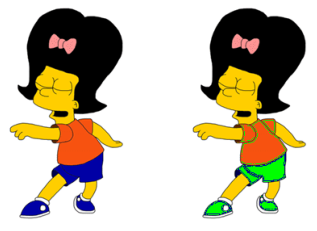

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.093454492
Bart TShirt: 7.286125887 - Bart Shorts: 5.362736407 - Bart Sneakers: 5.362736407


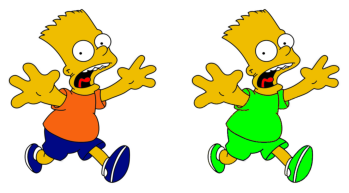

Homer Mouth: 0.001013274 - Homer Pants: 0.061809707 - Homer Shoes: 0.194548586
Bart TShirt: 4.348971527 - Bart Shorts: 4.550613031 - Bart Sneakers: 4.550613031


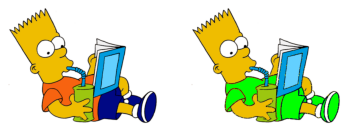

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.069741492
Bart TShirt: 12.124170851 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


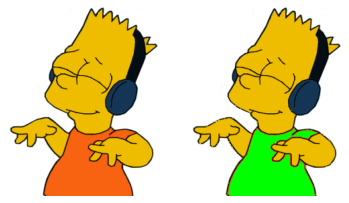

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.173299101
Bart TShirt: 8.090500642 - Bart Shorts: 0.118741977 - Bart Sneakers: 0.118741977


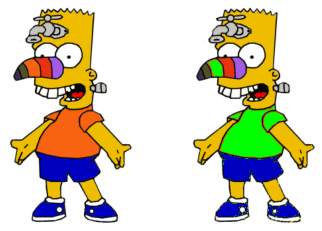

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.562080987
Bart TShirt: 2.018771789 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


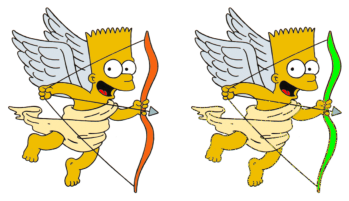

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 8.474266319 - Bart Shorts: 5.609766802 - Bart Sneakers: 5.609766802


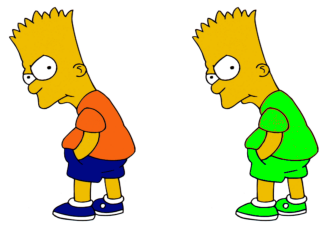

Homer Mouth: 0.0 - Homer Pants: 0.076864807 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


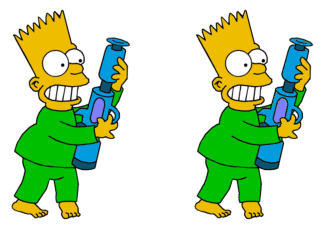

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.366119137
Bart TShirt: 3.460815357 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


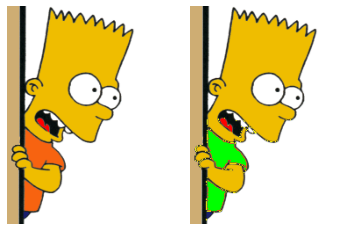

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.235437937
Bart TShirt: 10.429447853 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


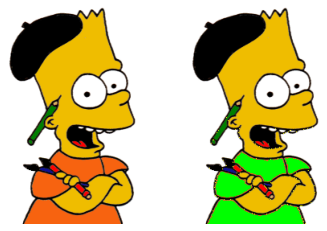

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.694371751
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


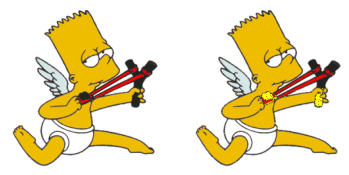

Homer Mouth: 0.039284559 - Homer Pants: 0.0 - Homer Shoes: 0.233396497
Bart TShirt: 8.228959652 - Bart Shorts: 6.133012895 - Bart Sneakers: 6.133012895


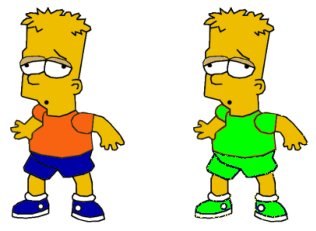

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.101015515
Bart TShirt: 5.829625995 - Bart Shorts: 2.764938958 - Bart Sneakers: 2.764938958


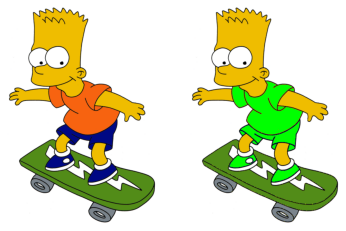

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.1
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


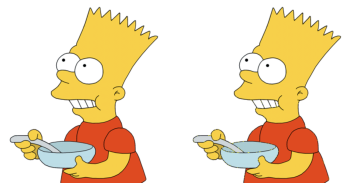

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.140763817
Bart TShirt: 1.193031037 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


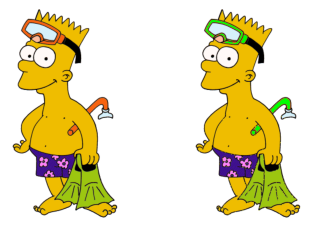

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.137115161
Bart TShirt: 4.095916838 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


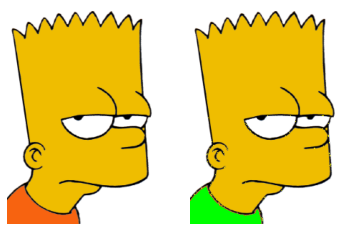

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.076660132
Bart TShirt: 9.58125974 - Bart Shorts: 6.173025687 - Bart Sneakers: 6.173025687


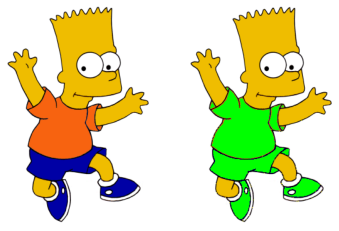

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.101961416
Bart TShirt: 2.589283319 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


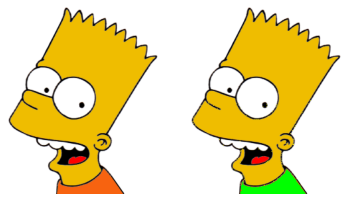

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.32228575
Bart TShirt: 4.400440044 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


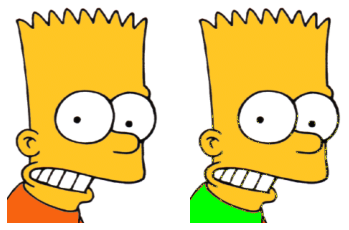

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.49909064
Bart TShirt: 6.990894315 - Bart Shorts: 4.090005498 - Bart Sneakers: 4.090005498


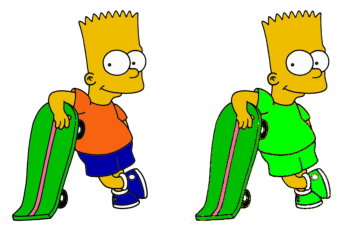

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.122647849
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


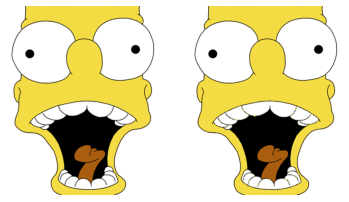

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.145933977
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


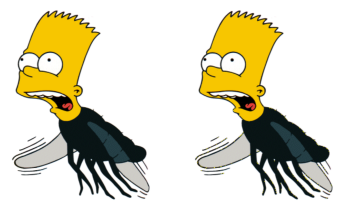

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.179773057
Bart TShirt: 7.88857369 - Bart Shorts: 5.175484892 - Bart Sneakers: 5.175484892


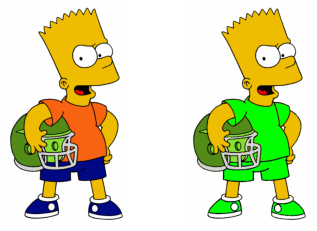

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.024805103
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


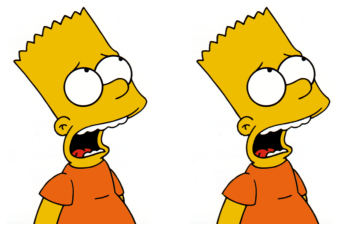

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.159848485
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


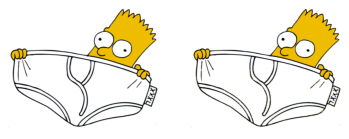

Homer Mouth: 0.002906977 - Homer Pants: 0.0 - Homer Shoes: 0.149418605
Bart TShirt: 6.029651163 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


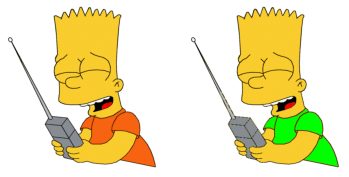

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.701011074
Bart TShirt: 3.420959718 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


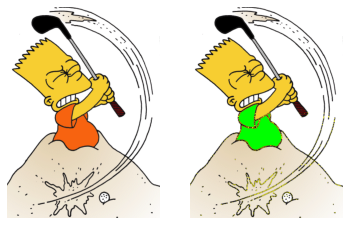

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.3986195
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


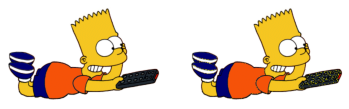

Homer Mouth: 0.006931208 - Homer Pants: 0.0 - Homer Shoes: 0.072777682
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


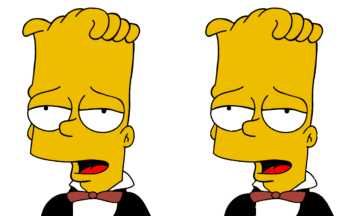

Homer Mouth: 0.001619433 - Homer Pants: 0.0 - Homer Shoes: 0.136842105
Bart TShirt: 9.861538462 - Bart Shorts: 8.660728745 - Bart Sneakers: 8.660728745


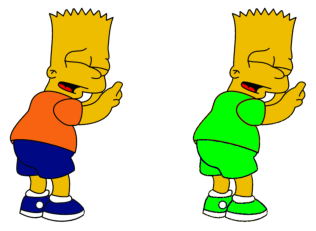

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.058479532
Bart TShirt: 4.980506823 - Bart Shorts: 0.072124756 - Bart Sneakers: 0.0


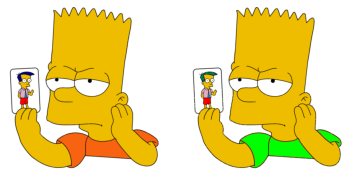

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.167883747
Bart TShirt: 9.668452534 - Bart Shorts: 1.034365711 - Bart Sneakers: 1.034365711


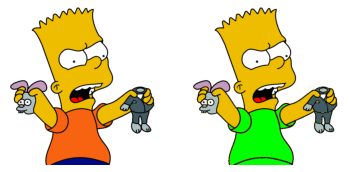

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.041262818
Bart TShirt: 10.734478157 - Bart Shorts: 5.981352718 - Bart Sneakers: 5.981352718


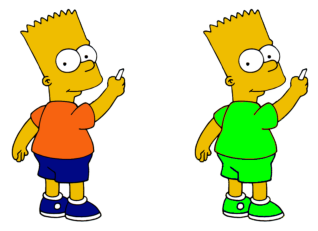

Homer Mouth: 0.979401078 - Homer Pants: 16.958948664 - Homer Shoes: 2.404184248
Bart TShirt: 2.48769339 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


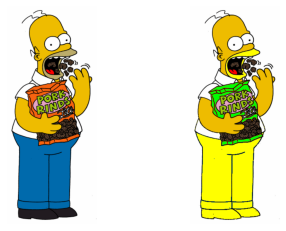

Homer Mouth: 0.058665773 - Homer Pants: 15.566543748 - Homer Shoes: 0.64867583
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


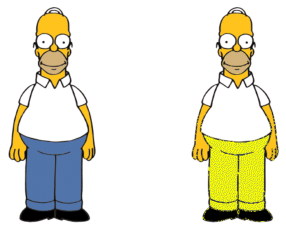

Homer Mouth: 1.829063147 - Homer Pants: 14.074792961 - Homer Shoes: 2.1875
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


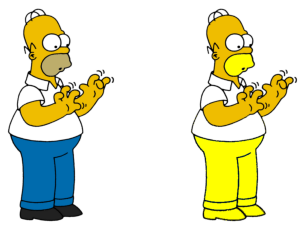

Homer Mouth: 2.804717308 - Homer Pants: 0.152271939 - Homer Shoes: 0.107180021
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


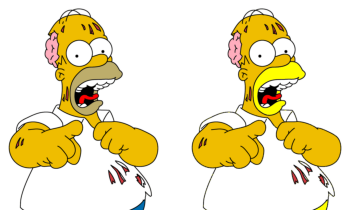

Homer Mouth: 2.510348847 - Homer Pants: 0.0 - Homer Shoes: 0.133630737
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


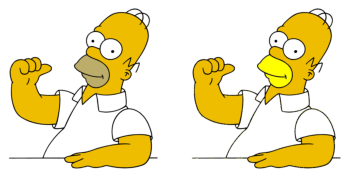

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.222503718
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


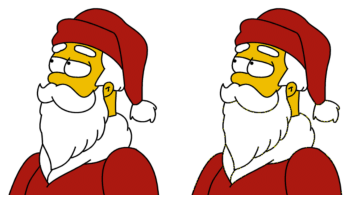

Homer Mouth: 6.507196996 - Homer Pants: 0.0 - Homer Shoes: 0.175231208
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


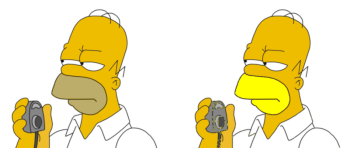

Homer Mouth: 4.677915738 - Homer Pants: 0.0 - Homer Shoes: 0.293961583
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


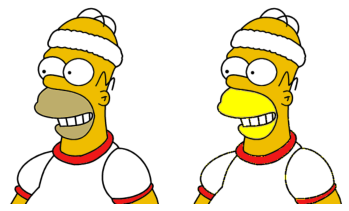

Homer Mouth: 3.118380316 - Homer Pants: 0.0 - Homer Shoes: 0.300431807
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


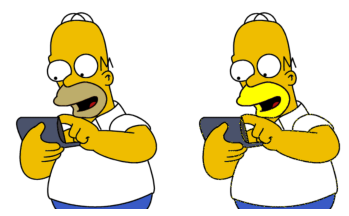

Homer Mouth: 4.06671025 - Homer Pants: 0.0 - Homer Shoes: 0.150645216
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


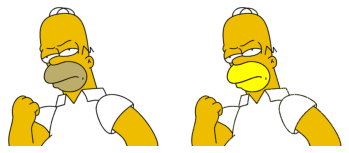

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 1.19478171
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


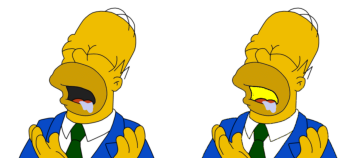

Homer Mouth: 3.195100354 - Homer Pants: 0.0 - Homer Shoes: 0.380755608
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


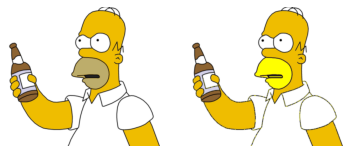

Homer Mouth: 0.355610904 - Homer Pants: 7.673539043 - Homer Shoes: 0.158664268
Bart TShirt: 0.275356303 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


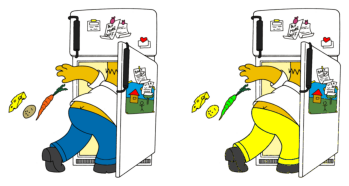

Homer Mouth: 0.663501119 - Homer Pants: 4.680165379 - Homer Shoes: 0.034754821
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


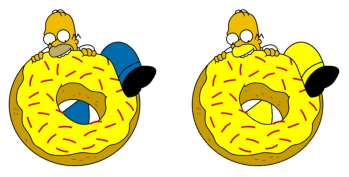

Homer Mouth: 0.501514993 - Homer Pants: 5.802685195 - Homer Shoes: 2.626423571
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


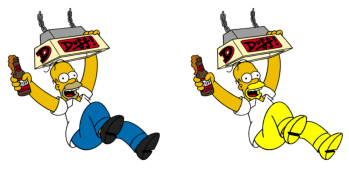

Homer Mouth: 1.448672089 - Homer Pants: 3.566102811 - Homer Shoes: 0.060380396
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


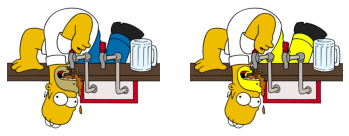

Homer Mouth: 0.858062038 - Homer Pants: 0.0 - Homer Shoes: 0.229520791
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


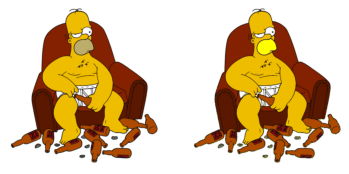

Homer Mouth: 2.046468542 - Homer Pants: 4.588248639 - Homer Shoes: 0.060496068
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


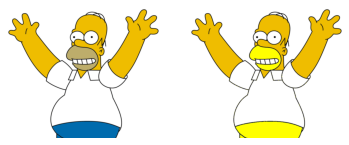

Homer Mouth: 5.3241237 - Homer Pants: 0.0 - Homer Shoes: 0.083744238
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


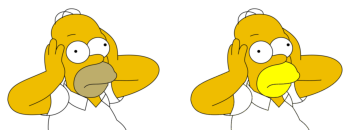

Homer Mouth: 3.059849386 - Homer Pants: 21.512485137 - Homer Shoes: 4.97238737
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


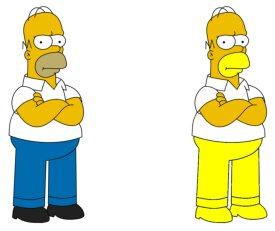

Homer Mouth: 1.87017211 - Homer Pants: 19.164520938 - Homer Shoes: 1.432443421
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


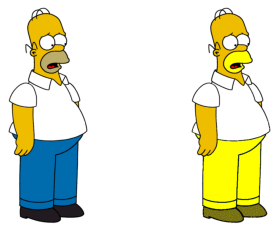

Homer Mouth: 1.181676162 - Homer Pants: 6.996385642 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


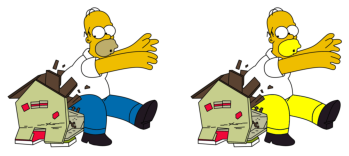

Homer Mouth: 1.657903494 - Homer Pants: 0.0 - Homer Shoes: 0.071214642
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


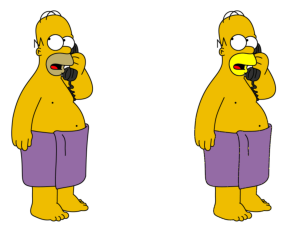

Homer Mouth: 1.375206612 - Homer Pants: 14.950413223 - Homer Shoes: 1.574380165
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


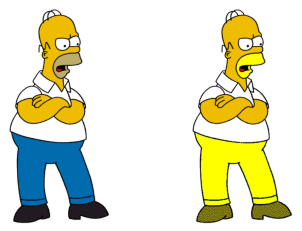

Homer Mouth: 2.107477925 - Homer Pants: 32.308912804 - Homer Shoes: 0.172461369
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


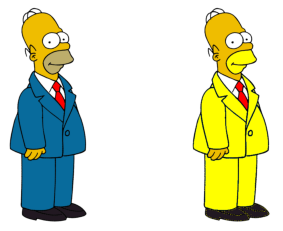

Homer Mouth: 0.480936756 - Homer Pants: 0.0 - Homer Shoes: 0.095098438
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


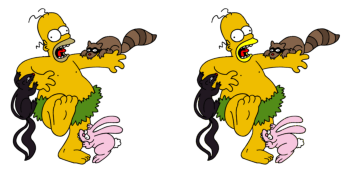

Homer Mouth: 1.405737574 - Homer Pants: 0.084906762 - Homer Shoes: 0.102418781
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


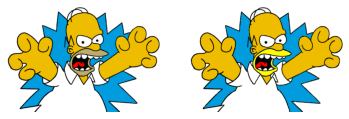

Homer Mouth: 1.429483853 - Homer Pants: 0.0 - Homer Shoes: 0.112570356
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


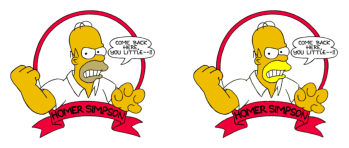

Homer Mouth: 1.623553703 - Homer Pants: 13.843546691 - Homer Shoes: 1.437531653
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


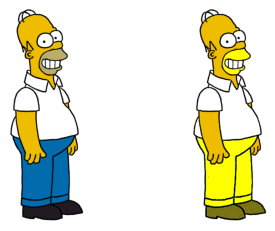

Homer Mouth: 4.966005609 - Homer Pants: 0.0 - Homer Shoes: 0.10440414
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


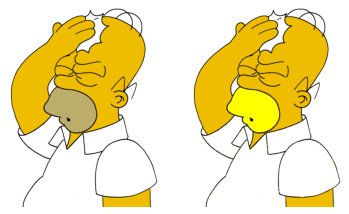

Homer Mouth: 1.365418968 - Homer Pants: 12.872923639 - Homer Shoes: 1.497854342
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


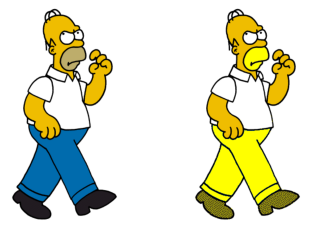

Homer Mouth: 1.475956065 - Homer Pants: 10.607126113 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


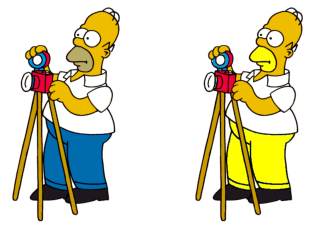

Homer Mouth: 2.580283794 - Homer Pants: 13.434466019 - Homer Shoes: 1.690627334
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


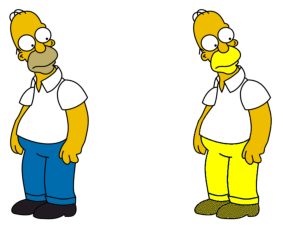

Homer Mouth: 1.208582988 - Homer Pants: 13.390433758 - Homer Shoes: 1.592026425
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


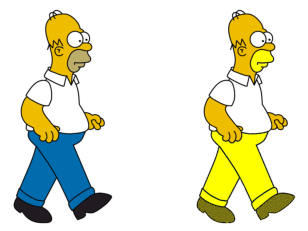

Homer Mouth: 0.308702684 - Homer Pants: 9.513506425 - Homer Shoes: 0.713021243
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


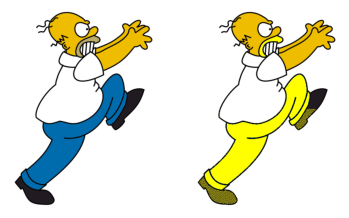

Homer Mouth: 2.111849548 - Homer Pants: 0.273614253 - Homer Shoes: 0.134332579
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


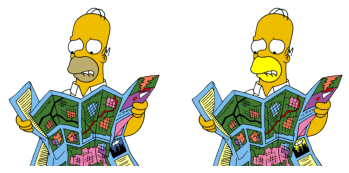

Homer Mouth: 0.312468394 - Homer Pants: 0.187906888 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


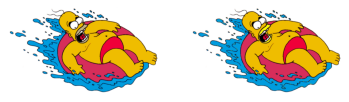

Homer Mouth: 1.699590092 - Homer Pants: 3.907748997 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


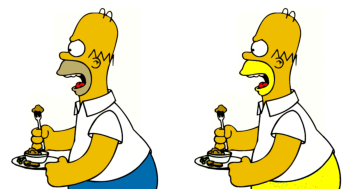

Homer Mouth: 1.261645963 - Homer Pants: 0.046760305 - Homer Shoes: 0.044995765
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


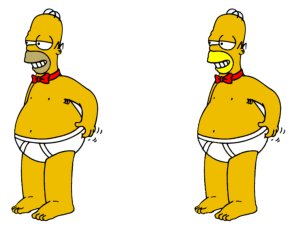

Homer Mouth: 4.183953033 - Homer Pants: 0.0 - Homer Shoes: 0.129158513
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


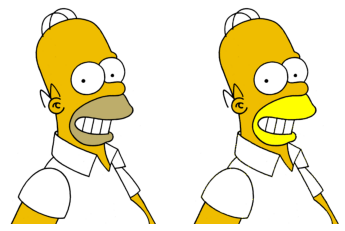

Homer Mouth: 0.307761177 - Homer Pants: 16.612575308 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


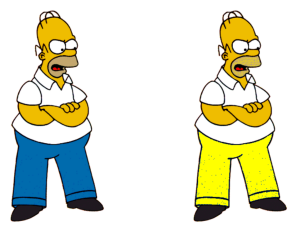

Homer Mouth: 7.688952498 - Homer Pants: 0.0 - Homer Shoes: 0.069515437
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


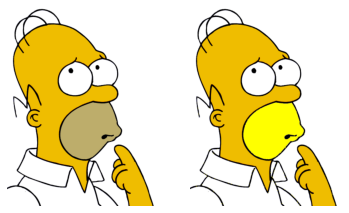

Homer Mouth: 0.0 - Homer Pants: 0.063628651 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


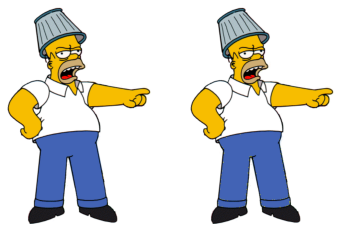

Homer Mouth: 0.0 - Homer Pants: 0.039908211 - Homer Shoes: 0.633542851
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


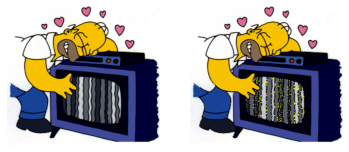

Homer Mouth: 0.0 - Homer Pants: 0.024797844 - Homer Shoes: 0.201617251
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


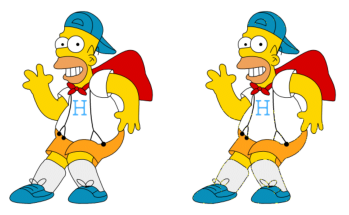

Homer Mouth: 0.092525727 - Homer Pants: 0.178281278 - Homer Shoes: 0.146687128
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


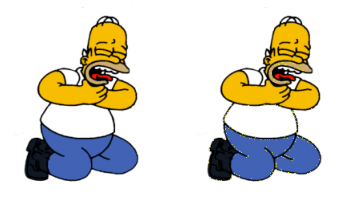

Homer Mouth: 0.028179839 - Homer Pants: 11.469194313 - Homer Shoes: 0.174202639
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


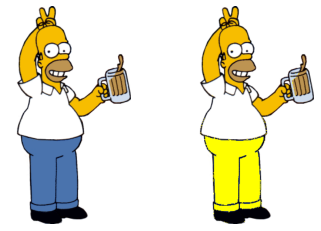

Homer Mouth: 0.491803279 - Homer Pants: 0.0 - Homer Shoes: 0.195081967
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


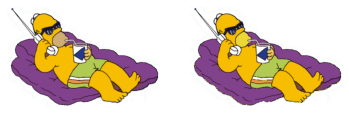

Homer Mouth: 0.191131498 - Homer Pants: 0.0 - Homer Shoes: 0.076452599
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


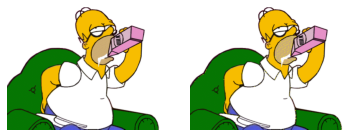

Homer Mouth: 1.085376162 - Homer Pants: 8.202874049 - Homer Shoes: 0.22541561
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


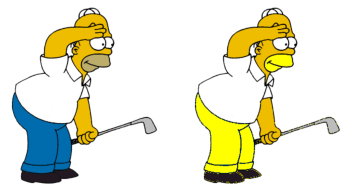

Homer Mouth: 0.138848864 - Homer Pants: 7.372088758 - Homer Shoes: 0.192554557
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


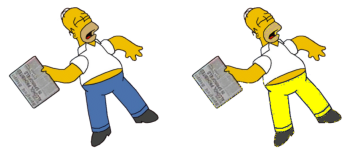

Homer Mouth: 0.078528726 - Homer Pants: 8.650825818 - Homer Shoes: 0.196321816
Bart TShirt: 0.525635829 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


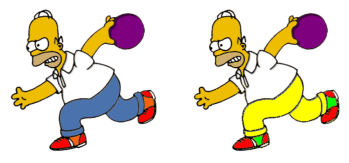

Homer Mouth: 0.070499893 - Homer Pants: 9.101044382 - Homer Shoes: 0.226255472
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


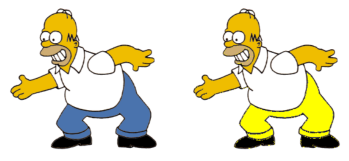

Homer Mouth: 0.018296095 - Homer Pants: 0.0 - Homer Shoes: 0.128072668
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


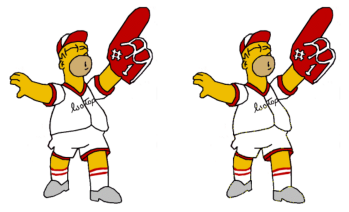

Homer Mouth: 0.072990481 - Homer Pants: 0.0 - Homer Shoes: 0.0304127
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


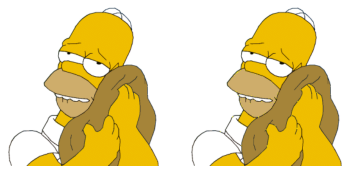

Homer Mouth: 0.039355119 - Homer Pants: 0.0 - Homer Shoes: 0.176419498
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


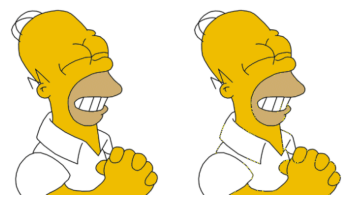

Homer Mouth: 0.028068487 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


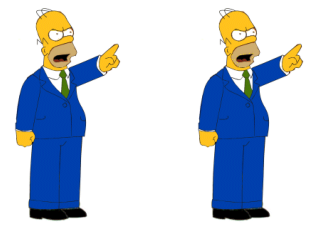

Homer Mouth: 1.207367796 - Homer Pants: 0.007130125 - Homer Shoes: 0.411170529
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


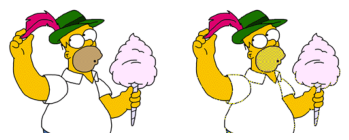

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.195828012
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


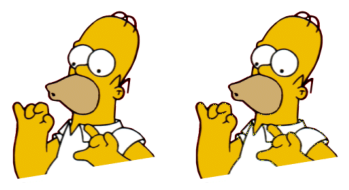

Homer Mouth: 0.660317686 - Homer Pants: 0.0 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


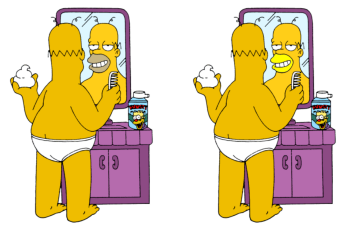

Homer Mouth: 0.0 - Homer Pants: 0.155041727 - Homer Shoes: 0.140366996
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


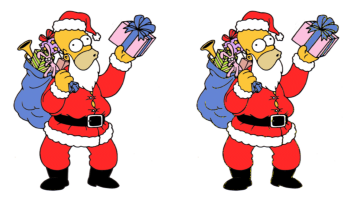

Homer Mouth: 0.058665773 - Homer Pants: 15.566543748 - Homer Shoes: 0.64867583
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


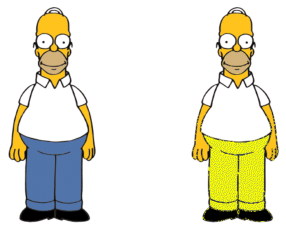

Homer Mouth: 0.058696928 - Homer Pants: 0.052827235 - Homer Shoes: 0.138916063
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


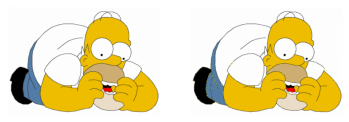

Homer Mouth: 0.516451479 - Homer Pants: 0.00666389 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


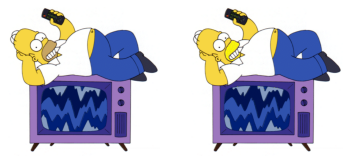

Homer Mouth: 0.112978525 - Homer Pants: 0.0 - Homer Shoes: 0.253034547
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


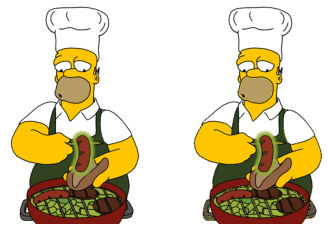

Homer Mouth: 1.399440542 - Homer Pants: 2.311739089 - Homer Shoes: 0.178804158
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


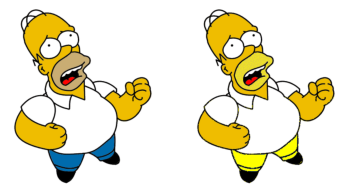

Homer Mouth: 0.051243533 - Homer Pants: 0.0 - Homer Shoes: 0.036502243
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


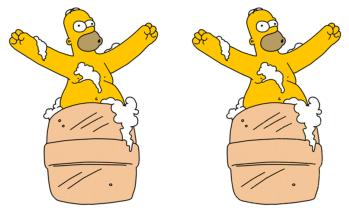

Homer Mouth: 1.619217082 - Homer Pants: 0.0 - Homer Shoes: 0.15658363
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


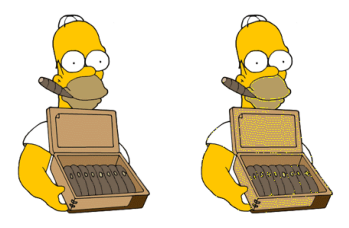

Homer Mouth: 1.242105263 - Homer Pants: 0.0 - Homer Shoes: 0.114127424
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


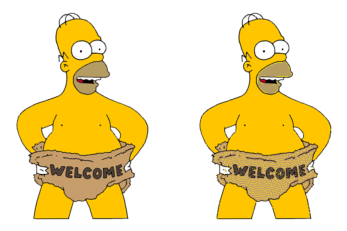

Homer Mouth: 1.862687235 - Homer Pants: 8.791415663 - Homer Shoes: 0.221833279
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


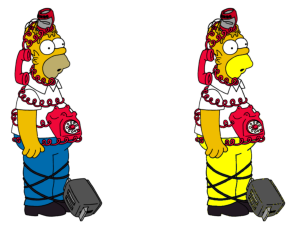

Homer Mouth: 0.171260997 - Homer Pants: 5.309090909 - Homer Shoes: 0.127859238
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


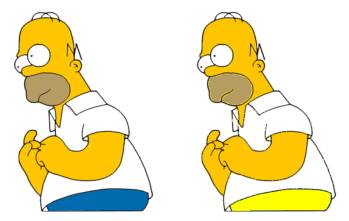

Homer Mouth: 0.842998586 - Homer Pants: 11.237623762 - Homer Shoes: 0.178217822
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


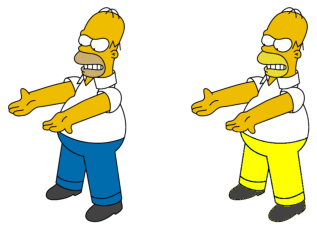

Homer Mouth: 2.599648343 - Homer Pants: 0.0 - Homer Shoes: 0.170742694
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


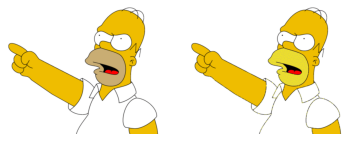

Homer Mouth: 0.023988486 - Homer Pants: 0.0 - Homer Shoes: 0.011423088
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


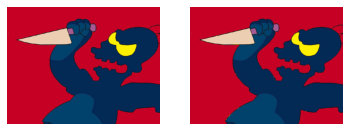

Homer Mouth: 0.120609675 - Homer Pants: 0.0 - Homer Shoes: 0.096090126
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


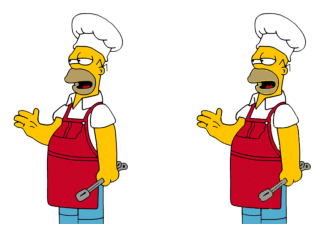

Homer Mouth: 0.42369338 - Homer Pants: 0.0 - Homer Shoes: 1.361207898
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


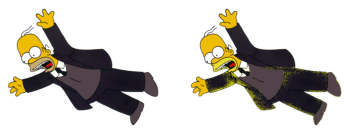

Homer Mouth: 0.773406766 - Homer Pants: 7.593233674 - Homer Shoes: 0.0
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


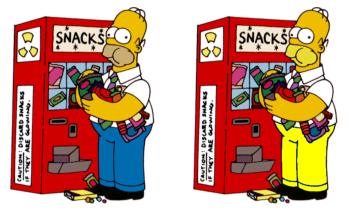

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.143328579
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


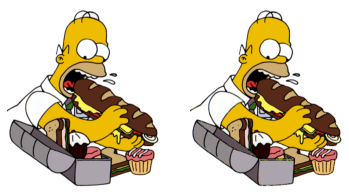

Homer Mouth: 0.942271339 - Homer Pants: 9.738548786 - Homer Shoes: 0.077940963
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


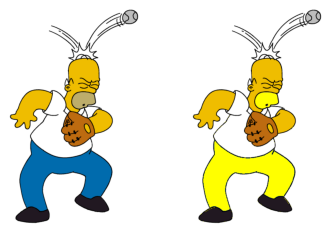

Homer Mouth: 0.065261372 - Homer Pants: 0.024146708 - Homer Shoes: 0.274097762
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


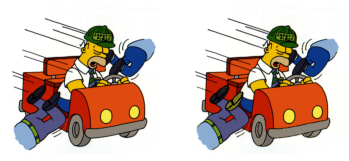

Homer Mouth: 8.468309859 - Homer Pants: 0.0 - Homer Shoes: 0.278755869
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


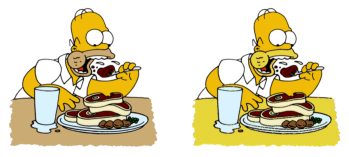

Homer Mouth: 0.462344029 - Homer Pants: 0.325868984 - Homer Shoes: 0.182895128
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


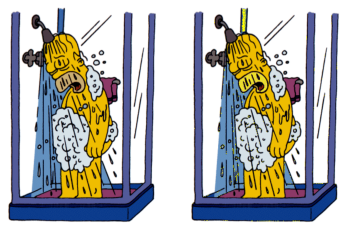

Homer Mouth: 0.258885898 - Homer Pants: 4.702521562 - Homer Shoes: 0.315195297
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


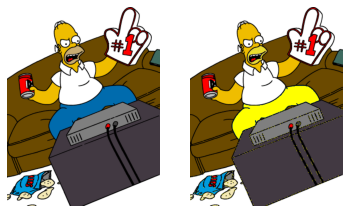

Homer Mouth: 0.291149711 - Homer Pants: 0.0 - Homer Shoes: 0.127377998
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


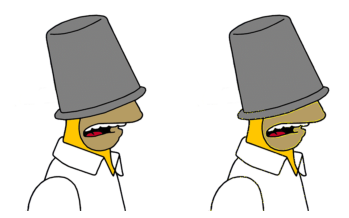

Homer Mouth: 0.902278636 - Homer Pants: 0.0 - Homer Shoes: 0.102879228
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


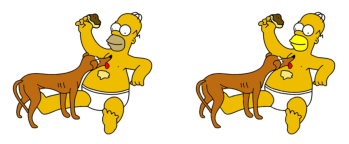

Homer Mouth: 0.000558659 - Homer Pants: 0.0 - Homer Shoes: 0.094413408
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


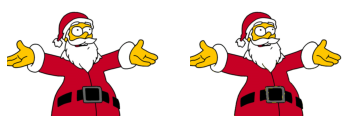

Homer Mouth: 1.954776665 - Homer Pants: 12.935145446 - Homer Shoes: 0.020664441
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


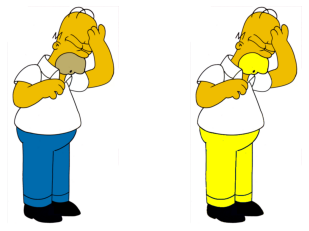

Homer Mouth: 2.836879433 - Homer Pants: 0.0 - Homer Shoes: 0.166272656
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


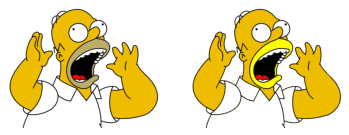

Homer Mouth: 1.765465465 - Homer Pants: 0.0 - Homer Shoes: 0.221021021
Bart TShirt: 0.077177177 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


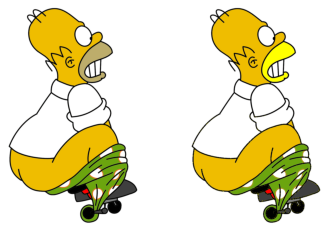

Homer Mouth: 3.856391115 - Homer Pants: 0.001529707 - Homer Shoes: 0.10402007
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


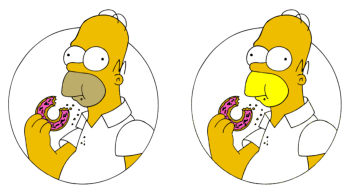

Homer Mouth: 3.52862254 - Homer Pants: 0.0 - Homer Shoes: 0.154541841
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


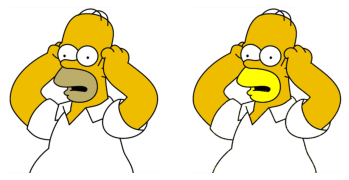

Homer Mouth: 1.630342605 - Homer Pants: 11.98906038 - Homer Shoes: 0.136391904
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


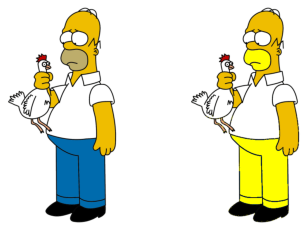

Homer Mouth: 6.814814815 - Homer Pants: 0.0 - Homer Shoes: 0.086140439
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


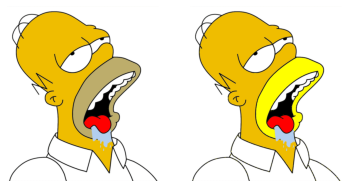

Homer Mouth: 7.385644191 - Homer Pants: 0.0 - Homer Shoes: 0.11119025
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


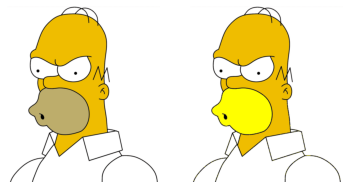

Homer Mouth: 1.684732624 - Homer Pants: 1.178557351 - Homer Shoes: 0.141242938
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


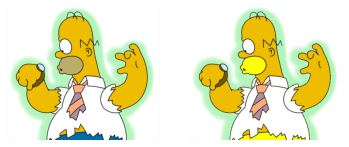

Homer Mouth: 1.587927248 - Homer Pants: 0.0 - Homer Shoes: 0.270285489
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


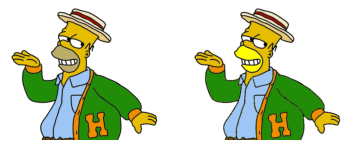

Homer Mouth: 9.431089476 - Homer Pants: 0.0 - Homer Shoes: 0.148923638
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


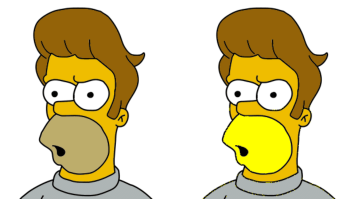

Homer Mouth: 3.25017819 - Homer Pants: 0.0 - Homer Shoes: 0.334348474
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


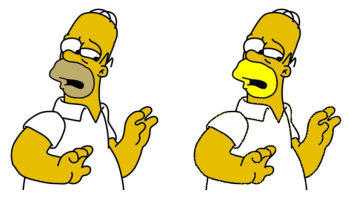

Homer Mouth: 0.752833109 - Homer Pants: 10.047759306 - Homer Shoes: 1.163529862
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


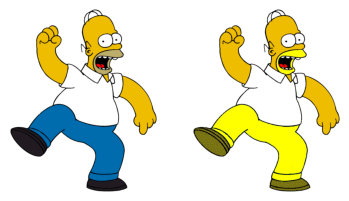

Homer Mouth: 0.0 - Homer Pants: 0.017687075 - Homer Shoes: 0.18877551
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


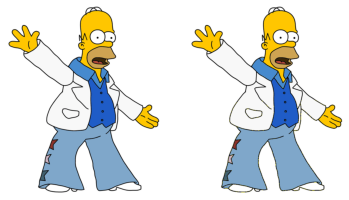

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.103598232
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


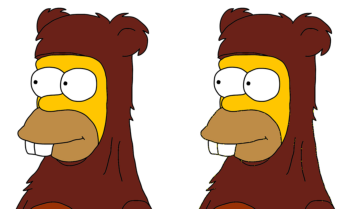

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 1.157139824
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


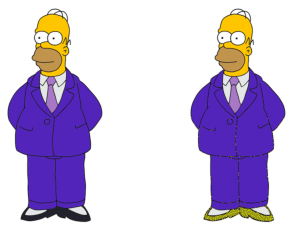

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.021648145
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


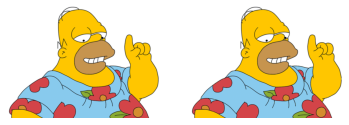

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.079567656
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


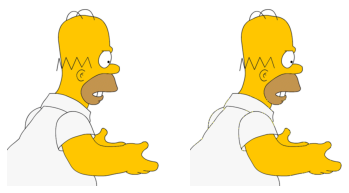

Homer Mouth: 6.485411788 - Homer Pants: 0.0 - Homer Shoes: 0.171984778
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


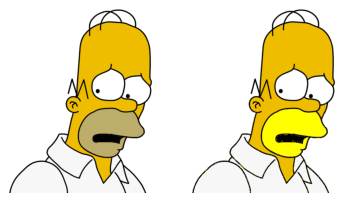

Homer Mouth: 0.0 - Homer Pants: 0.0 - Homer Shoes: 0.161636882
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


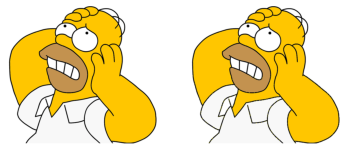

Homer Mouth: 4.264975221 - Homer Pants: 0.0 - Homer Shoes: 0.329939668
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


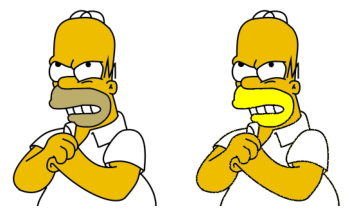

Homer Mouth: 1.429133481 - Homer Pants: 0.0 - Homer Shoes: 0.034558659
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


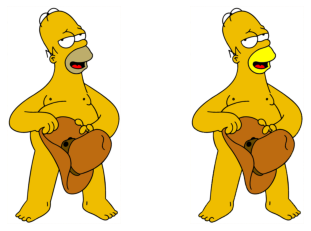

Homer Mouth: 0.853902001 - Homer Pants: 13.744247745 - Homer Shoes: 0.161778023
Bart TShirt: 0.0 - Bart Shorts: 0.0 - Bart Sneakers: 0.0


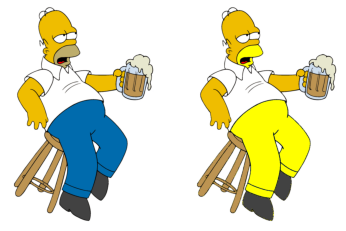

In [4]:
b_n = 1 #count of bart images
h_n =1  #count of homer images

#create directories to store feature detected images
os.mkdir('./Images')
os.mkdir('./Images/Bart')
os.mkdir('./Images/Homer')

for image_path in files:  #go through each image one by one
  try:  #try for DSstore file
    original_image = cv2.imread(image_path) #read images
    (H, W) = original_image.shape[:2]   #stores heigth, width of each image
  except:
    continue

  image = original_image.copy() #copy of image
  image_features = [] #features of each images

#counting how many number of pixels having the features of holmer and bart based on colors
  mouth = pants = shoes =0  #holmer's features
  tshirt = shorts = sneakers =0   #bart's features
  
  image_name = os.path.basename(os.path.normpath(image_path)) #extract only name freom file path

  if(image_name.startswith('b')): #encoding categorical data 
        class_name = 0  #bart - 0
  else:
        class_name = 1  #homer -1

#go through each pixel one by one to extract colors of each pixel
  for height in range(0,H): #each pixel in height
    for width in range(0, W): #each pixel in width
      blue = image.item(height, width, 0)     #extract value from height,width (location) and 0th channel in BGR which is blue channel
      green = image.item(height, width, 1)     #extract value from height,width (location) and 1st channel in BGR which is green channel
      red = image.item(height, width, 2)     #extract value from height,width (location) and 2nd channel in BGR which is red channel

      #Homer - brown(mouth)
      if(blue>=95 and blue<=140 and green >=160 and green <=185 and red >= 175 and red <= 200):
        image[height,width] = [0,255,255]   #color the pixel with yellow color
        mouth+=1  #incrementing that one pixel has the color of the feature

      #Homer - blue (pants)
      if(blue>=150 and blue<=180 and green >=98 and green <=120 and red >= 0 and red <= 90):
        image[height,width] = [0,255,255]   #color the pixel with yellow color
        pants+=1
      
      #Homer - gray(shoes)
      if(height > (H/2)):   #since shoes are present only at bottom only considering lower part of image 
        if(blue>=25 and blue<=45 and green >=25 and green <=45 and red >= 25 and red <= 45):
          image[height,width] = [0,255,255]   #color the pixel with yellow color
          shoes+=1

      #Bart - orange (tshirt)
      if(blue>=11 and blue<=22 and green >=85 and green <=105 and red >= 240 and red <= 255):
        image[height,width] = [0,255,0]   #color the pixel with green color
        tshirt+=1
      
      #Bart - blue (shorts)
      if(blue>=125 and blue<=170 and green >=0 and green <=12 and red >= 0 and red <= 20):
        image[height,width] = [0,255,0]   #color the pixel with green color
        shorts+=1
      
      #Bart - blue (sneakers)
      if(height > (H/2)):   #since sneakers are present only at bottom only considering lower part of image 
        if(blue>=125 and blue<=170 and green >=0 and green <=12 and red >= 0 and red <= 20):
          image[height,width] = [0,255,0]   #color the pixel with green color
          sneakers+=1

#normalise features with total number of pixels in the image
#consider we have 100*200 pixels of an image 20000 and 2000 of the pixels are detected to have mouth feature
# so (2000 / 20000) * 100 = 10 i.e,10% of image we have pixels to detect mouth feature
  mouth = round((mouth / (H*W))*100,9)    
  pants = round((pants / (H*W))*100,9)    
  shoes = round((shoes / (H*W))*100,9)    
  tshirt = round((tshirt / (H*W))*100,9)  
  shorts = round((shorts / (H*W))*100,9)  
  sneakers = round((sneakers / (H*W))*100,9)   

#appending features in a image to image_features
  image_features.append(mouth)
  image_features.append(pants)
  image_features.append(shoes)
  image_features.append(tshirt)
  image_features.append(shorts)
  image_features.append(sneakers)
#appending class names to image_features
  image_features.append(class_name)

#appending image_features to features (which contains all features of all images)
  features.append(image_features)
  print('Homer Mouth: %s - Homer Pants: %s - Homer Shoes: %s' % (image_features[0], image_features[1], image_features[2]))
  print('Bart TShirt: %s - Bart Shorts: %s - Bart Sneakers: %s' % (image_features[3], image_features[4], image_features[5]))

  f = (",".join([str(item) for item in image_features]))
  export += f +'\n' #adding all features to headings previously present to be saved as csv format later

  if(show_images==True):  #displaying original and feature extraction indicated image side by side
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)  #in opencv BGR is order of channel, to see we need to convert to RGB
    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
    fig, im = plt.subplots(1,2) #creating subplots with one row and 2 columns (first column has original image and second column has feature detected image)
    im[0].axis('off') #hide axis of this subplot
    im[0].imshow(original_image)
    im[1].axis('off')
    im[1].imshow(image)
    plt.show()

  if(class_name==0):
    fig.savefig('./Images/Bart/Bart ('+str(b_n)+').png')
    b_n+=1
  elif(class_name==1):
    fig.savefig('./Images/Homer/Homer ('+str(h_n)+').png')
    h_n+=1

# Exporting To CSV

In [5]:
with open('features.csv', 'w') as file:
  for l in export:
    file.write(l)
file.closed

True

# Creating Zip of Feature Detected Images

In [6]:
def get_all_file_paths(directory):
  # initializing empty file paths list
  file_paths = []
  # crawling through directory and subdirectories
  for root, directories, files in os.walk(directory):
    for filename in files:
      # join the two strings in order to form the full filepath.
      filepath = os.path.join(root, filename)
      file_paths.append(filepath)
  # returning all file paths
  return file_paths

directory ='./Images'  # path to folder which needs to be zipped
file_paths = get_all_file_paths(directory)  # calling function to get all file paths in the directory

with zipfile.ZipFile('Images.zip','w') as zip:
  # writing each file one by one
  for file in file_paths:
    zip.write(file)